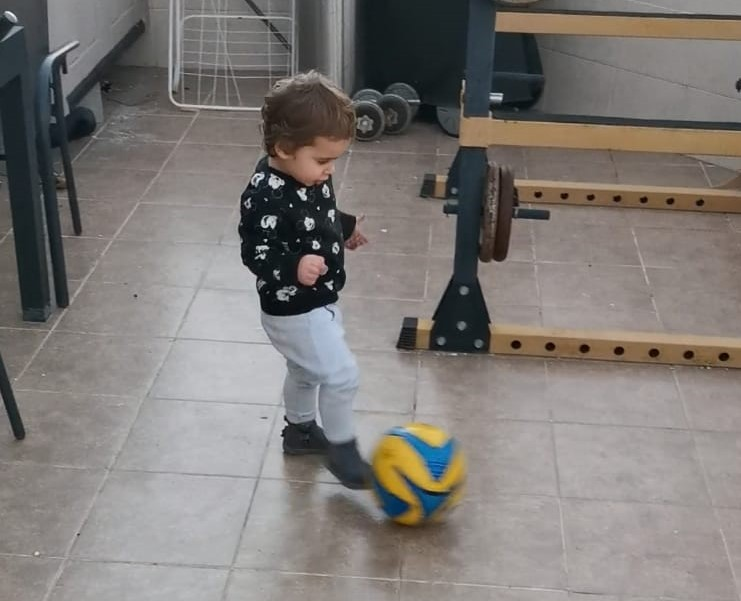

### imports

In [1056]:
#imports of the used library
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay
from matplotlib import cm
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, plot_confusion_matrix, roc_auc_score

### load of the data

In [1057]:
#loading the data
df = pd.read_csv('C:\matala 3\FIFAvsReal-Life.csv')

In [1058]:
#Look at the inital Data 
df

,Unnamed: 0,Players,club,league,age,nationality,Position,overall,pac,sho,...,12/13.9,12/13.10,12/13.11,12/13.12,12/13.13,12/13.14,12/13.15,12/13.16,12/13.17,12/13.18
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Sub,CO,Off,Pen SV,Pen M,Goals conceded,Conceded 1+,OG,Apps,Form
1,0.0,Aaron Cresswell,West Ham United,English Premier League,27.0,England,Defender,76.0,76.0,59.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,Aaron Hughes,Heart of Midlothian,Scottish Premiership,37.0,Northern Ireland,Defender,71.0,23.0,35.0,...,15.0,1.0,0.0,0.0,0.0,43.0,23.0,0.0,24.0,1.625
3,2.0,Aaron Hunt,Hamburger SV,German Bundesliga,30.0,Germany,Midfielder,76.0,68.0,73.0,...,2.0,2.0,6.0,0.0,1.0,0.0,0.0,0.0,28.0,4.035714285714286
4,3.0,Aaron Lennon,Everton,English Premier League,30.0,England,Midfielder,77.0,83.0,64.0,...,1.0,1.0,15.0,0.0,0.0,0.0,0.0,0.0,34.0,3.147058823529412
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3918,3917.0,Zlatan Ibrahimovic,Manchester United,English Premier League,35.0,Sweden,Forward,88.0,65.0,88.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,6.735294117647059
3919,3918.0,Zlatko Junuzovic,SV Werder Bremen,German Bundesliga,29.0,Austria,Midfielder,79.0,78.0,74.0,...,2.0,2.0,8.0,0.0,0.0,0.0,0.0,0.0,30.0,2.4
3920,3919.0,Zoltan Gera,Free Agent,Rest Of The World,38.0,Hungary,Midfielder,74.0,49.0,73.0,...,5.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,16.0,3.25
3921,3920.0,Zoltan Stieber,D.C. United,USA Major League Soccer,28.0,Hungary,Midfielder,70.0,70.0,66.0,...,4.0,2.0,5.0,0.0,0.0,0.0,0.0,0.0,16.0,2.9375


###  data info

In [1059]:
#Data frame information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3923 entries, 0 to 3922
Columns: 149 entries, Unnamed: 0 to 12/13.18
dtypes: float64(46), object(103)
memory usage: 4.5+ MB


In [1060]:
# numeral information of the data frame 
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,3922.0,1960.500000,1132.328206,0.0,980.25,1960.5,2940.75,3921.0
age,3922.0,25.977562,4.485916,16.0,22.00,26.0,29.00,40.0
overall,3922.0,71.811066,6.331105,48.0,68.00,72.0,76.00,94.0
pac,3922.0,69.197348,11.547373,23.0,64.00,70.0,77.00,96.0
sho,3922.0,58.743243,14.202873,14.0,49.00,62.0,69.00,93.0
pas,3922.0,63.142529,10.081475,27.0,57.00,64.0,70.00,95.0
dri,3922.0,68.022693,10.089765,28.0,63.00,69.0,75.00,96.0
def,3922.0,53.364865,18.535414,15.0,36.00,58.0,70.00,90.0
phy,3922.0,68.148139,9.279212,32.0,63.00,69.0,75.00,91.0
international_reputation,3922.0,1.434472,0.681983,1.0,1.00,1.0,2.00,5.0


### Checking and Cleaning the data

In [1061]:
#checking the data that is different for their type
df.iloc[:, 46:149]

,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,16/17,16/17.1,...,12/13.9,12/13.10,12/13.11,12/13.12,12/13.13,12/13.14,12/13.15,12/13.16,12/13.17,12/13.18
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Points,Start,...,Sub,CO,Off,Pen SV,Pen M,Goals conceded,Conceded 1+,OG,Apps,Form
1,76.0,75.0,77.0,14.0,7.0,9.0,9.0,12.0,59.0,24.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,75.0,73.0,71.0,8.0,6.0,16.0,12.0,11.0,0.0,0.0,...,15.0,1.0,0.0,0.0,0.0,43.0,23.0,0.0,24.0,1.625
3,28.0,34.0,35.0,15.0,12.0,7.0,16.0,15.0,57.0,14.0,...,2.0,2.0,6.0,0.0,1.0,0.0,0.0,0.0,28.0,4.035714285714286
4,40.0,37.0,37.0,14.0,7.0,7.0,16.0,11.0,20.0,6.0,...,1.0,1.0,15.0,0.0,0.0,0.0,0.0,0.0,34.0,3.147058823529412
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3918,15.0,41.0,27.0,13.0,15.0,10.0,9.0,12.0,146.0,27.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,6.735294117647059
3919,68.0,66.0,63.0,15.0,9.0,11.0,15.0,8.0,97.0,28.0,...,2.0,2.0,8.0,0.0,0.0,0.0,0.0,0.0,30.0,2.4
3920,53.0,58.0,68.0,14.0,12.0,12.0,7.0,9.0,0.0,0.0,...,5.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,16.0,3.25
3921,26.0,31.0,32.0,6.0,6.0,9.0,16.0,7.0,0.0,0.0,...,4.0,2.0,5.0,0.0,0.0,0.0,0.0,0.0,16.0,2.9375


In [1062]:
#dropping wide data that show the performance by seasons
df.drop(df.iloc[:, 49:149], inplace = True, axis = 1) 

In [1063]:
#checking categorial data
df.iloc[:, 0:7]

,Unnamed: 0,Players,club,league,age,nationality,Position
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,Aaron Cresswell,West Ham United,English Premier League,27.0,England,Defender
2,1.0,Aaron Hughes,Heart of Midlothian,Scottish Premiership,37.0,Northern Ireland,Defender
3,2.0,Aaron Hunt,Hamburger SV,German Bundesliga,30.0,Germany,Midfielder
4,3.0,Aaron Lennon,Everton,English Premier League,30.0,England,Midfielder
...,...,...,...,...,...,...,...
3918,3917.0,Zlatan Ibrahimovic,Manchester United,English Premier League,35.0,Sweden,Forward
3919,3918.0,Zlatko Junuzovic,SV Werder Bremen,German Bundesliga,29.0,Austria,Midfielder
3920,3919.0,Zoltan Gera,Free Agent,Rest Of The World,38.0,Hungary,Midfielder
3921,3920.0,Zoltan Stieber,D.C. United,USA Major League Soccer,28.0,Hungary,Midfielder


In [1064]:
#dropping categorial data that useless for the classification
df.drop(df.iloc[:, 0:4], inplace = True, axis = 1) 
df.drop(['nationality'], inplace = True, axis = 1) 

In [1065]:
df.shape

(3923, 44)

### changing the data from categorial to numeral

In [1066]:
rows = df.shape[0]

for row in range(1,rows):

    val = df.loc[row,'Position']
    if val=='Defender' :
        df.loc[row,'Position'] = 0
    elif val=='Midfielder' :
        df.loc[row,'Position'] = 1
    else :
        df.loc[row,'Position'] = 2
(df['Position']).value_counts()

1    1504
2    1260
0    1158
Name: Position, dtype: int64

In [1067]:
rows = df.shape[0]

for row in range(1,rows):

    val = df.loc[row,'work_rate_att']
    if val=='High' :
        df.loc[row,'work_rate_att'] = 0
    elif val=='Low' :
        df.loc[row,'work_rate_att'] = 1
    else :
        df.loc[row,'work_rate_att'] = 2
        rows = df.shape[0]

for row in range(1,rows):

    val = df.loc[row,'work_rate_def']
    if val=='High' :
        df.loc[row,'work_rate_def'] = 0
    elif val=='Low' :
        df.loc[row,'work_rate_def'] = 1
    else :
        df.loc[row,'work_rate_def'] = 2

### checking the values of the changes to be true 

In [1068]:
(df['work_rate_def']).value_counts()

2    2845
0     726
1     351
Name: work_rate_def, dtype: int64

In [1069]:
(df['work_rate_att']).value_counts()

2    2551
0    1186
1     185
Name: work_rate_att, dtype: int64

In [1070]:
df['preferred_foot'] = np.where(df['preferred_foot']=="Right", 1, 0)
df['preferred_foot'].value_counts()

1    2931
0     992
Name: preferred_foot, dtype: int64

### checking for NaN values  

In [1071]:
df.isnull().values.any()

True

In [1072]:
df.isnull().sum()

age                         1
Position                    1
overall                     1
pac                         1
sho                         1
pas                         1
dri                         1
def                         1
phy                         1
international_reputation    1
skill_moves                 1
weak_foot                   1
work_rate_att               1
work_rate_def               1
preferred_foot              0
crossing                    1
finishing                   1
heading_accuracy            1
short_passing               1
volleys                     1
dribbling                   1
curve                       1
free_kick_accuracy          1
long_passing                1
ball_control                1
acceleration                1
sprint_speed                1
agility                     1
reactions                   1
balance                     1
shot_power                  1
jumping                     1
stamina                     1
strength  

In [1073]:
df.isnull()

,age,Position,overall,pac,sho,pas,dri,def,phy,international_reputation,...,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
0,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3918,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3919,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3920,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3921,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [1074]:
#by understanding that there is one row,dropping this row
df.drop(df.index[0],inplace=True)

## Explanation of the relevant features

overall- is the average of the key Player Attributes rates of a player within their Potential rate calculated based on their position and international reputation.

age-the age of the players.

Position-the position of the player on the court.

pac-is a Player Attribute in FIFA that determines a player's speed in walking and running.   

sho-the rating for a kicking technique to score goal.

pas-is a Player Attribute in FIFA that determines how accurate a player passes the ball to a teammate.   

dri-is a Player Attribute in FIFA that determines a player's ability to carry the ball and past an opponent while being in control.

def-Defending refers to moves and activities that a players perform to defend their own goal when in it is under attack. It also refers to a player's or a team's ability to defend the ball possession in a match. 

phy-is a Player Attribute in FIFA that represents the physical and body status of a player. Players with high PHY rating, are able to win the physical battles on the pitch and maintain their fitness throughout a full match.

international_reputation-represnt if the player plar for his country team in a worldwide games.
                              
crossing-is a Player Attribute in FIFA that determines the accuracy and the quality of a player's crosses.

finishing-is a Player Attribute in FIFA that determines the ability of a player to score (ability for finishing - How well they can finish a opportunity with a score).

heading_accuracy-is a Player Attribute in FIFA that determines a player's accuracy when using the head to pass, shoot or clear the ball.                                
                  
curve- is a Player Attribute in FIFA that determines a player's ability to curve the ball when passing and shooting.          
               
ball_control- is a Player Attribute in FIFA that determines the ability of a player to control the ball on the pitch.                
acceleration-is a Player Attribute in FIFA that determines the increment of a player's running speed (sprint speed) on the pitch. The acceleration rate specifies how fast a player can reach their maximum sprint speed.                       

agility-is a Player Attribute in FIFA that determines how quick and graceful a player is able to control the ball. Agility depends on both mental and physical skills of the player.

reactions- is a Player Attribute in FIFA that determines the acting speed of a player in response to the situations happening around them.

balance-is a Player Attribute in FIFA that determines the even distribution of enabling a player to remain upright and steady when running, carrying and controlling the ball.

shot_power-is a Player Attribute in FIFA that determines the strength of a player's shootings.

jumping-is a Player Attribute in FIFA that determines a player's ability and quality for jumping from the surface for headers.  

stamina-is a Player Attribute in FIFA that determines a player's ability to sustain prolonged physical or mental effort in a match.

strength-is a Player Attribute in FIFA that determines the quality or state of being physically strong of a player.             

aggression- is a Player Attribute in FIFA that determines the aggression level of a player on pushing, pulling and tackling.                  
interceptions- is a Player Attribute in FIFA that determines a player's capability to intercept the ball - to catch the opposing team's passes.

positioning-is a Player Attribute in FIFA that determines that how well a player is able to perform the positioning on the field as a player or on the goal line as a goalkeeper.    

vision-is a Player Attribute in FIFA that determines a player's mental awareness about his teammates' positioning, for passing the ball to them.

penalties- is a Player Attribute in FIFA that determine a player's accuracy for the shots taking from the penalty kicks.                   
composure- is a Player Attribute in FIFA that determines a player's the state or feeling of being calm and controlling their frustration in matches frustration.

marking-is a Player Attribute that determines a player's capability to mark an opposition player or players to prevent them from taking control of the ball.

standing_tackle-is a Player Attribute that determines the ability of performing standing tackle of a player.             
        


# visualiztion of the data

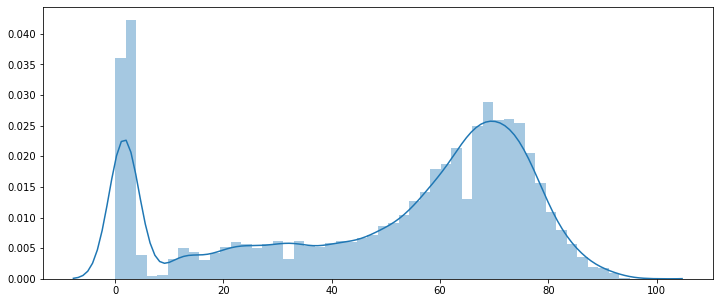

In [1075]:
#the distribution of all the data after cleaning
sns.distplot(df);

In [1076]:
df.tail()

,age,Position,overall,pac,sho,pas,dri,def,phy,international_reputation,...,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
3918,35.0,2,88.0,65.0,88.0,81.0,82.0,32.0,82.0,5.0,...,85.0,84.0,20.0,86.0,83.0,91.0,91.0,15.0,41.0,27.0
3919,29.0,1,79.0,78.0,74.0,80.0,81.0,67.0,74.0,2.0,...,81.0,76.0,75.0,73.0,75.0,70.0,78.0,68.0,66.0,63.0
3920,38.0,1,74.0,49.0,73.0,77.0,76.0,61.0,66.0,2.0,...,74.0,61.0,67.0,70.0,75.0,74.0,71.0,53.0,58.0,68.0
3921,28.0,1,70.0,70.0,66.0,67.0,73.0,31.0,54.0,2.0,...,63.0,41.0,31.0,64.0,68.0,65.0,69.0,26.0,31.0,32.0
3922,27.0,0,77.0,55.0,49.0,58.0,57.0,78.0,76.0,1.0,...,56.0,82.0,81.0,44.0,47.0,48.0,69.0,78.0,79.0,71.0


###  working on the classification features

In [1077]:
df_overall=df['overall']

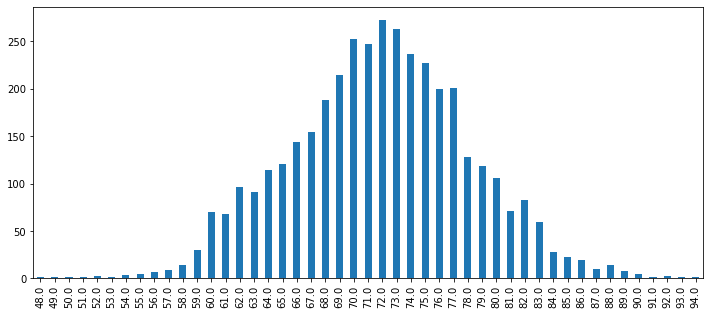

In [1078]:
#the distribution of the data in the overall column
df['overall'].value_counts().sort_index().plot.bar()
plt.rcParams["figure.figsize"] = [12,5]

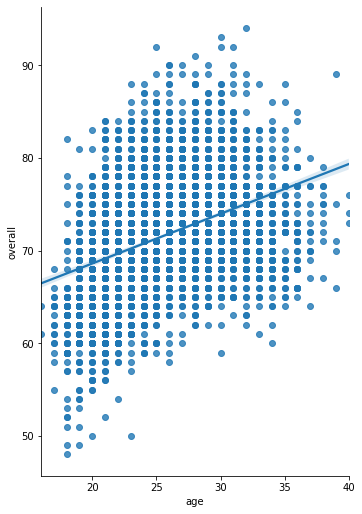

In [1079]:
#checking the correlation between the age and the prefomance of the players
sns.pairplot(df, x_vars='age', y_vars='overall', height=7, aspect=0.7, kind='reg')

In [1080]:
df.shape[0]

3922

### define the feature to 3 class 

In [1081]:
rows = df.shape[0]+1

for row in range(1,rows):

    val = df.loc[row,'overall']
    if val<69 :
        df.loc[row,'overall'] = 0
    else :
        df.loc[row,'overall'] = 1

In [1082]:
df['overall']

1       1.0
2       1.0
3       1.0
4       1.0
5       0.0
       ... 
3918    1.0
3919    1.0
3920    1.0
3921    1.0
3922    1.0
Name: overall, Length: 3922, dtype: float64

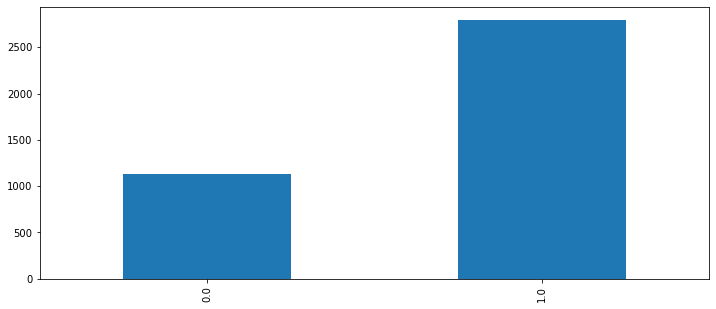

In [1083]:
#visualizition of the distrubation after the changes
df['overall'].value_counts().sort_index().plot.bar()

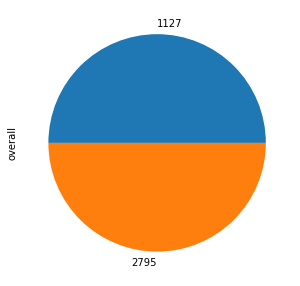

In [1084]:
df['overall'].value_counts().value_counts(sort=False).plot.pie()
plt.show()

In [1085]:
df

,age,Position,overall,pac,sho,pas,dri,def,phy,international_reputation,...,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
1,27.0,0,1.0,76.0,59.0,72.0,76.0,73.0,68.0,2.0,...,62.0,68.0,71.0,63.0,68.0,59.0,72.0,76.0,75.0,77.0
2,37.0,0,1.0,23.0,35.0,52.0,51.0,72.0,70.0,2.0,...,26.0,66.0,68.0,29.0,41.0,45.0,84.0,75.0,73.0,71.0
3,30.0,1,1.0,68.0,73.0,75.0,77.0,39.0,64.0,2.0,...,75.0,59.0,55.0,75.0,74.0,79.0,77.0,28.0,34.0,35.0
4,30.0,1,1.0,83.0,64.0,71.0,82.0,38.0,62.0,2.0,...,57.0,57.0,42.0,71.0,73.0,62.0,77.0,40.0,37.0,37.0
5,19.0,2,0.0,79.0,69.0,49.0,68.0,21.0,63.0,1.0,...,66.0,47.0,12.0,59.0,42.0,63.0,70.0,13.0,22.0,19.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3918,35.0,2,1.0,65.0,88.0,81.0,82.0,32.0,82.0,5.0,...,85.0,84.0,20.0,86.0,83.0,91.0,91.0,15.0,41.0,27.0
3919,29.0,1,1.0,78.0,74.0,80.0,81.0,67.0,74.0,2.0,...,81.0,76.0,75.0,73.0,75.0,70.0,78.0,68.0,66.0,63.0
3920,38.0,1,1.0,49.0,73.0,77.0,76.0,61.0,66.0,2.0,...,74.0,61.0,67.0,70.0,75.0,74.0,71.0,53.0,58.0,68.0
3921,28.0,1,1.0,70.0,66.0,67.0,73.0,31.0,54.0,2.0,...,63.0,41.0,31.0,64.0,68.0,65.0,69.0,26.0,31.0,32.0


### Take a View of all features to gain insights

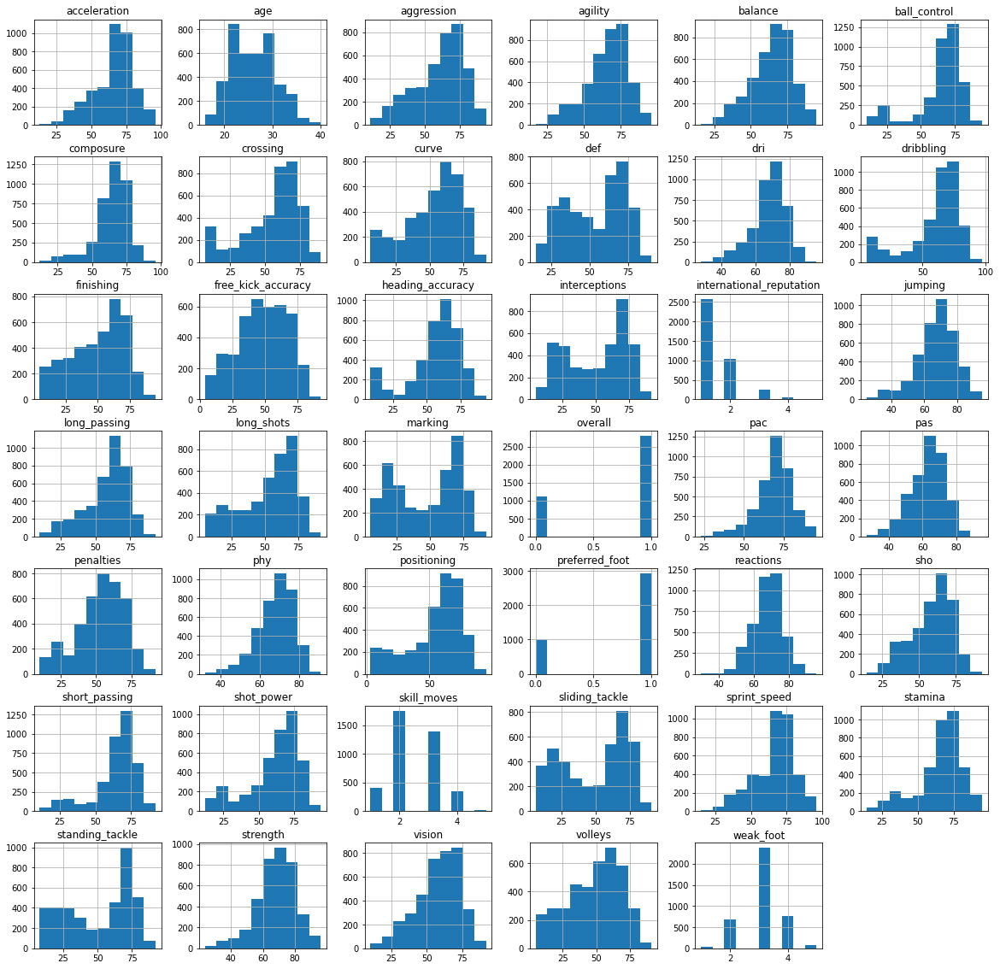

In [1086]:
df.hist(figsize=(20,20));

### Heatmap of all features.

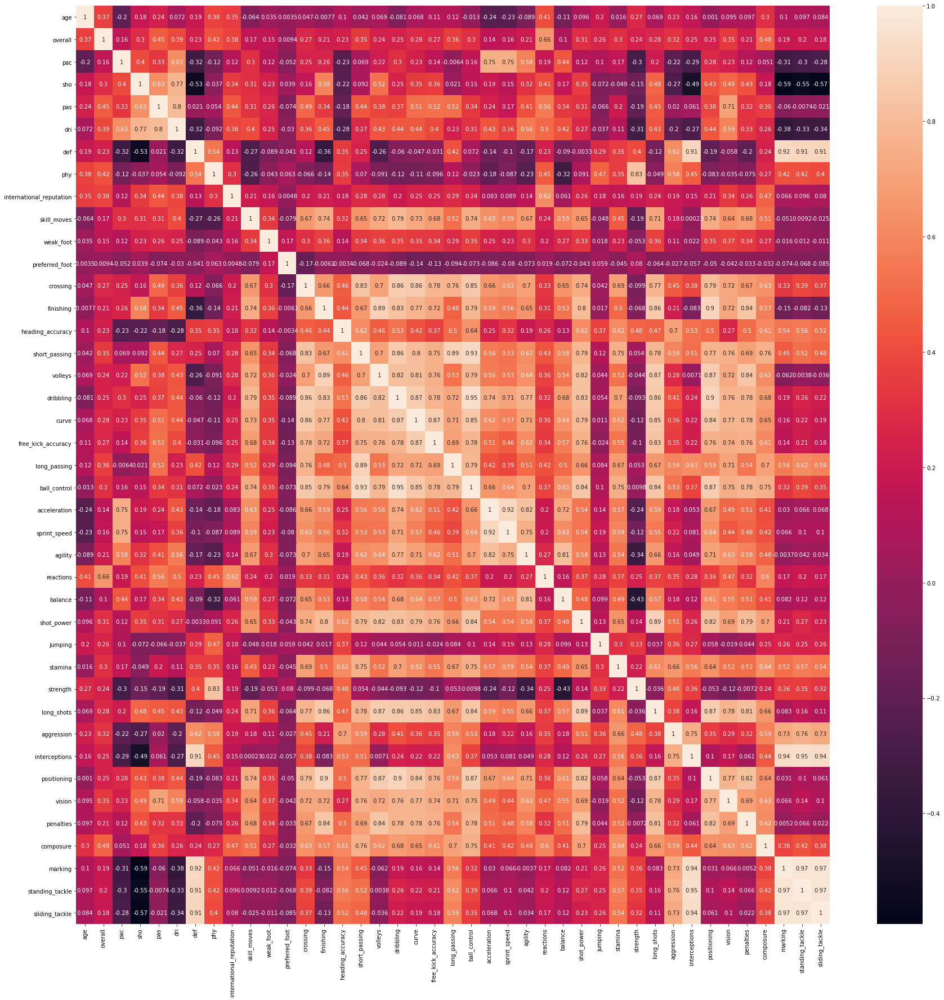

In [1087]:
cor = df.corr()
fig, ax = plt.subplots(figsize=(30,30))
sns.heatmap(cor, annot = True)

### heat map of all the feature with the correlation of the 'overall' feature 

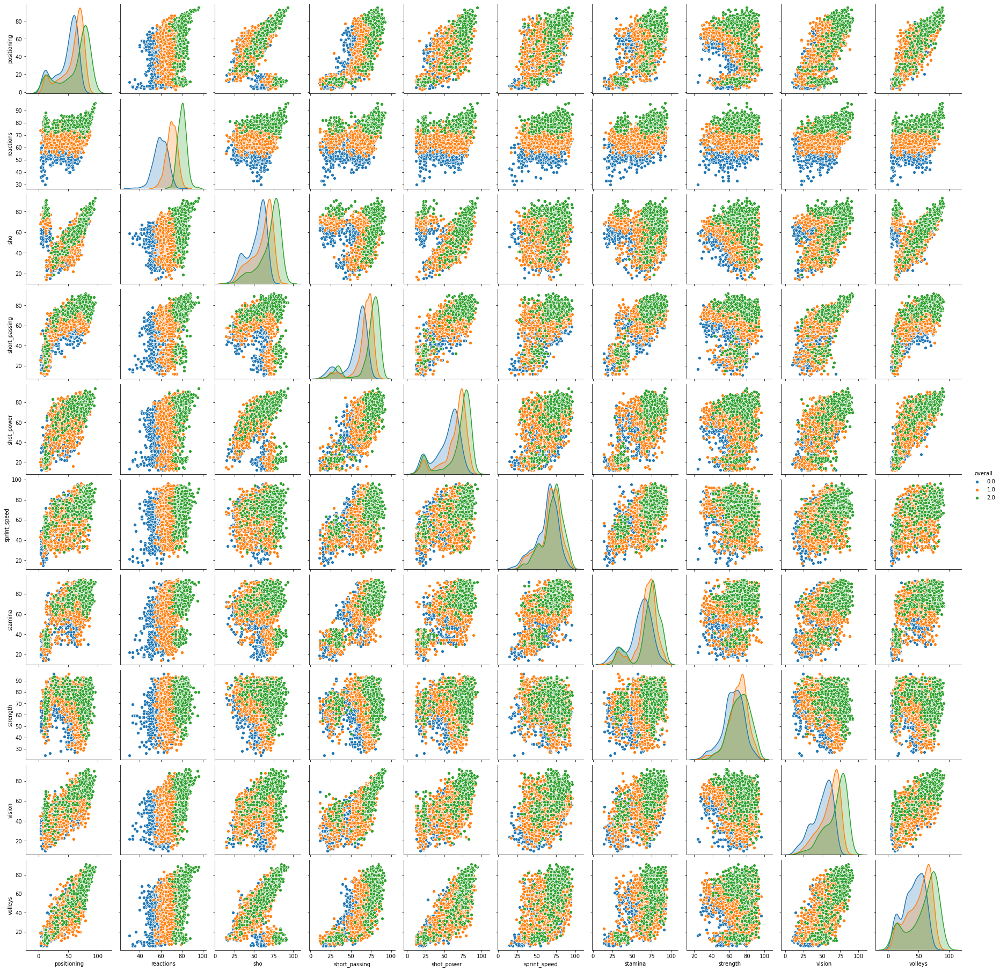

In [105]:
sns.pairplot(df, hue="overall",vars=["positioning","reactions","sho","short_passing","shot_power","sprint_speed","stamina","strength","vision","volleys"])

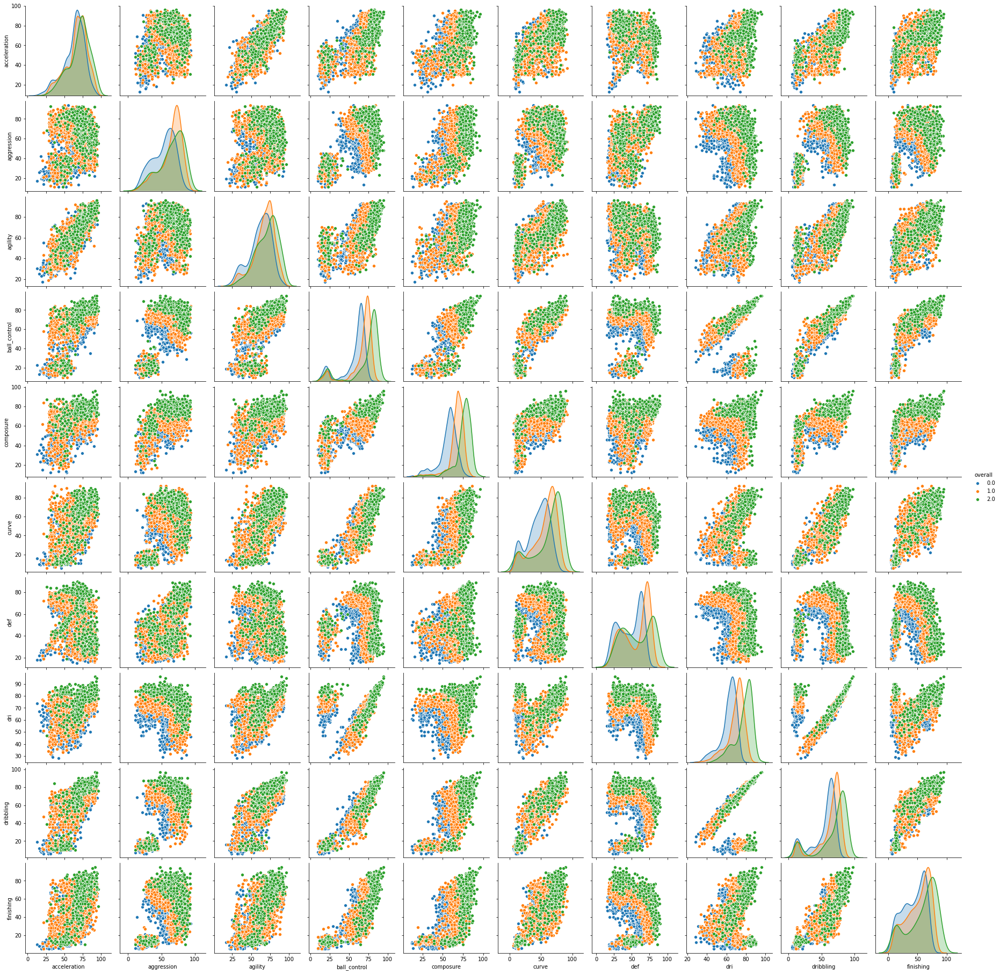

In [106]:
sns.pairplot(df, hue="overall",vars=["acceleration","aggression","agility","ball_control","composure","curve","def","dri","dribbling","finishing"])

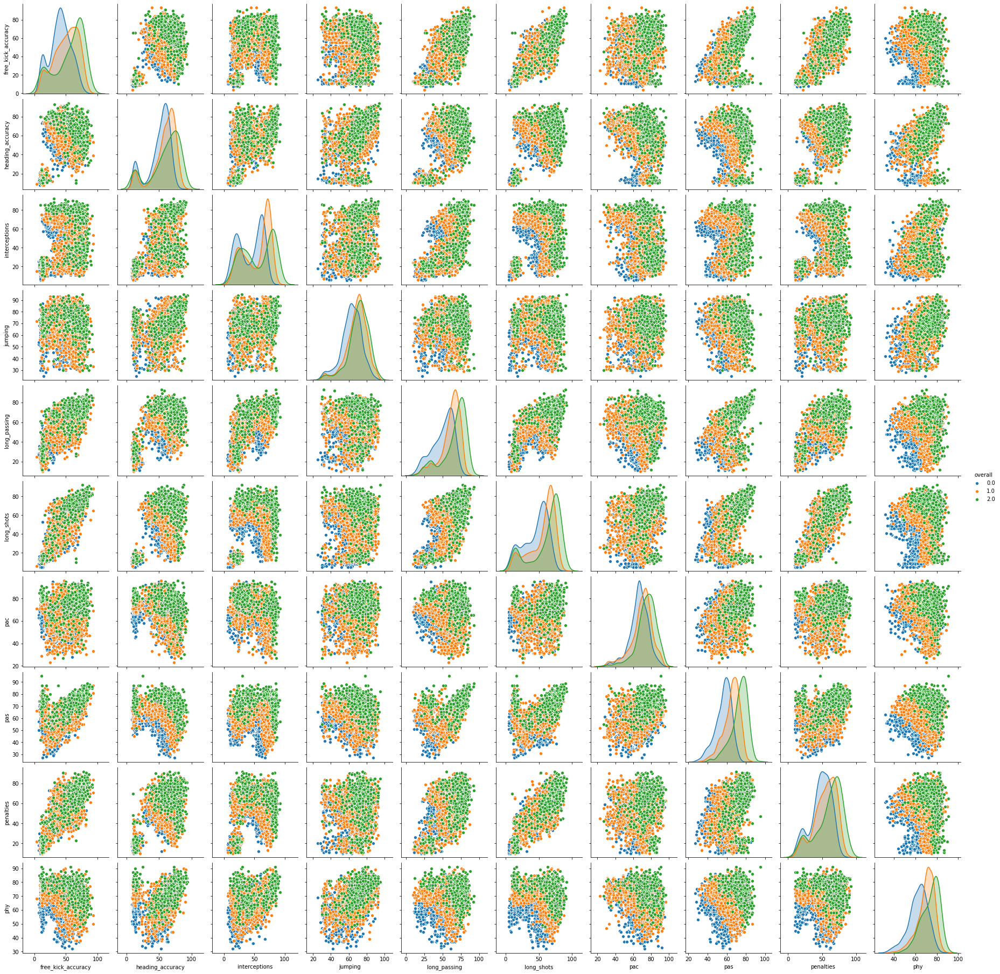

In [107]:
sns.pairplot(df, hue="overall",vars=["free_kick_accuracy","heading_accuracy","interceptions","jumping","long_passing","long_shots","pac","pas","penalties","phy"])

### machine learning 

In [1088]:
#define the vectors
X= df.drop(columns=['overall'])
Y = df.iloc[:, 2]
print(X)

       age Position   pac   sho   pas   dri   def   phy  \
1     27.0        0  76.0  59.0  72.0  76.0  73.0  68.0   
2     37.0        0  23.0  35.0  52.0  51.0  72.0  70.0   
3     30.0        1  68.0  73.0  75.0  77.0  39.0  64.0   
4     30.0        1  83.0  64.0  71.0  82.0  38.0  62.0   
5     19.0        2  79.0  69.0  49.0  68.0  21.0  63.0   
...    ...      ...   ...   ...   ...   ...   ...   ...   
3918  35.0        2  65.0  88.0  81.0  82.0  32.0  82.0   
3919  29.0        1  78.0  74.0  80.0  81.0  67.0  74.0   
3920  38.0        1  49.0  73.0  77.0  76.0  61.0  66.0   
3921  28.0        1  70.0  66.0  67.0  73.0  31.0  54.0   
3922  27.0        0  55.0  49.0  58.0  57.0  78.0  76.0   

      international_reputation  skill_moves  ...  long_shots aggression  \
1                          2.0          2.0  ...        62.0       68.0   
2                          2.0          2.0  ...        26.0       66.0   
3                          2.0          3.0  ...        75.0      

In [1089]:
print(Y)

1       1.0
2       1.0
3       1.0
4       1.0
5       0.0
       ... 
3918    1.0
3919    1.0
3920    1.0
3921    1.0
3922    1.0
Name: overall, Length: 3922, dtype: float64


### predict accuracy by the knn model befor training

In [1090]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X, Y)
y_pred = knn.predict(X)
print(metrics.accuracy_score(Y, y_pred))

1.0


In [1091]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X, Y)
y_pred = knn.predict(X)
print(metrics.accuracy_score(Y, y_pred))

0.942886282508924


### searching for the best k for knn model 

In [970]:
k_range = list(range(1, 40))
scores = []
for k in k_range: 
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X, Y)
    Y_pred = knn.predict(X)
    scores.append(metrics.accuracy_score(Y, Y_pred))

Text(0, 0.5, 'classified accuracy for each k')

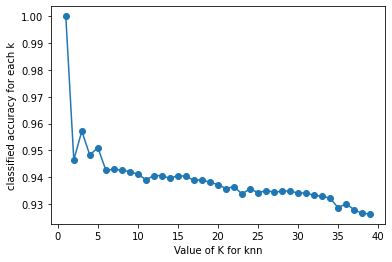

In [971]:
%matplotlib inline
plt.plot(k_range, scores, marker='o')
plt.xlabel('Value of K for knn')
plt.ylabel('classified accuracy for each k')

### define the parameters to  training the model 

In [1092]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [1093]:
#find the best k for knn after the training and testing
k_range = list(range(1, 40))
scores = []
for k in k_range: 
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, Y_train)
    Y_pred = knn.predict(X_test)
    scores.append(metrics.accuracy_score(Y_test, Y_pred))

Text(0, 0.5, 'Testing Accuracy')

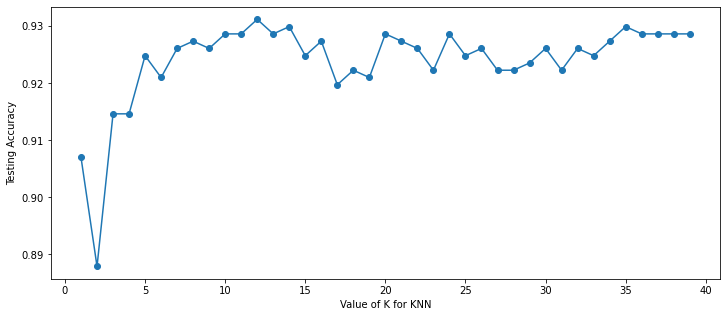

In [1094]:
plt.plot(k_range, scores, marker='o')
plt.xlabel('Value of K for KNN')
plt.ylabel('Testing Accuracy')

In [1095]:
#the accuracy of the best k until now by the graph
knn = KNeighborsClassifier(n_neighbors=12)
knn.fit(X_train, Y_train)
Y_pred = knn.predict(X_test)
print(metrics.accuracy_score(Y_test, Y_pred))

0.9312101910828026


###  the k=12 is the best

In [1096]:
k_range = list(range(1, 40))
k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X, Y, cv=10, scoring='accuracy')
    k_scores.append(scores.mean())

Text(0, 0.5, 'Cross-Validated Accuracy')

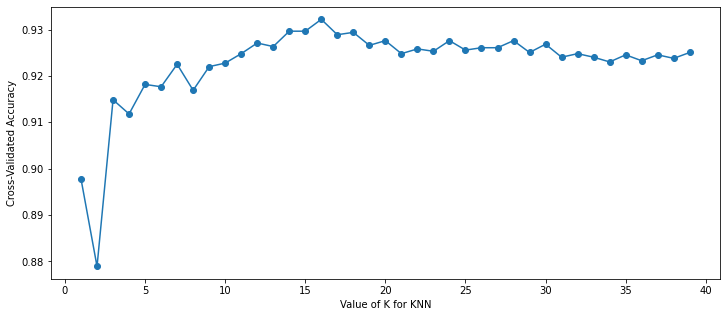

In [1097]:
plt.plot(k_range, k_scores, marker='o')
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

### trying to get the best parameters for the knn model by the search grid function  

In [1098]:
grid_params = {
    'n_neighbors' : [3,7,12,19],
    'weights' : ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

gs=GridSearchCV(
KNeighborsClassifier(),
    grid_params,
    verbose = 1,
    cv = 3,
)
gs_result = gs.fit(X_train, Y_train)
print(gs_result.best_score_)
print(gs_result.best_estimator_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0.9359242012557902
KNeighborsClassifier(metric='manhattan', n_neighbors=12, weights='distance')


[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    7.3s finished


In [1099]:
print(gs_result.best_params_)

{'metric': 'manhattan', 'n_neighbors': 12, 'weights': 'distance'}


In [1101]:
knn = KNeighborsClassifier(n_neighbors=12,weights='distance',metric='manhattan')
knn.fit(X_train, Y_train)
y_pred = knn.predict(X_test)
print(metrics.accuracy_score(Y_test, y_pred))

0.9414012738853503


### when we change the k to 12 and specific the paranters we get a higher accuracy precentege 

### trying to get better precenteg with another model 

# random forest model

In [1102]:
#trying to find the best estimator for the model
k_range = list(range(1,1000,50))
k_scores = []
for k in k_range:
    clf=RandomForestClassifier(n_estimators=k)
    clf.fit(X_train,Y_train)
    y_pred=clf.predict(X_test)
    k_scores.append(metrics.accuracy_score(Y_test, y_pred))

Text(0, 0.5, 'random forest Accuracy for each k')

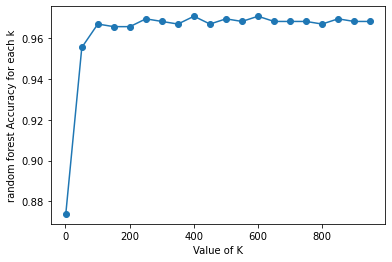

In [1103]:
%matplotlib inline
plt.plot(k_range, k_scores ,marker='o')
plt.xlabel('Value of K')
plt.ylabel('random forest Accuracy for each k')

In [1107]:
    clf=RandomForestClassifier(n_estimators=400)
    clf.fit(X_train,Y_train)
    y_pred=clf.predict(X_test)
    print(metrics.accuracy_score(Y_test, y_pred))

0.9707006369426752


## higher than the knn model!

# the best accuracy is 97% by the random forest model

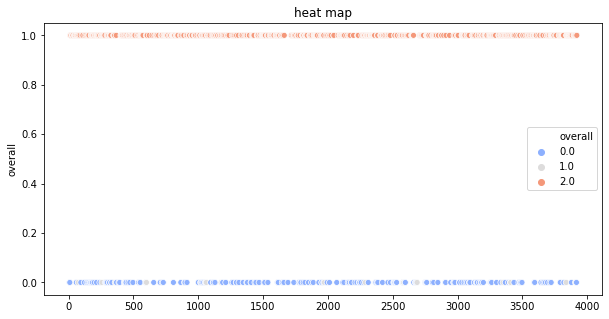

In [1108]:
#heat map to show where are the bad location for the model to predict
plt.figure(figsize=(10,5))
plt.title("heat map")
yy=y_pred+Y_test
sns.scatterplot(x=df.index,y=df_overall, hue=yy,palette=sns.color_palette('coolwarm', n_colors=3))

# DummyClassifier

In [1109]:
strategies = ['most_frequent','stratified', 'uniform'] 
test_scores = [] 
for s in strategies: 
    if s == 'most_frequent':
        dclf = DummyClassifier(strategy = s, random_state = 0) 
    else:
        dclf = DummyClassifier(strategy = s, random_state = 0) 
    dclf.fit(X_train, Y_train) 
    score = dclf.score(X_test, Y_test) 
    test_scores.append(score) 
print(test_scores)

[0.732484076433121, 0.6292993630573248, 0.5197452229299363]


1.Most Frequent: The classifier always predicts the most frequent class label in the training data.

2.Stratified: It generates predictions by respecting the class distribution of the training data. It is different from the “most frequent” strategy as it instead associates a probability with each data point of being the most frequent class label.

3.Uniform: It generates predictions uniformly at random.

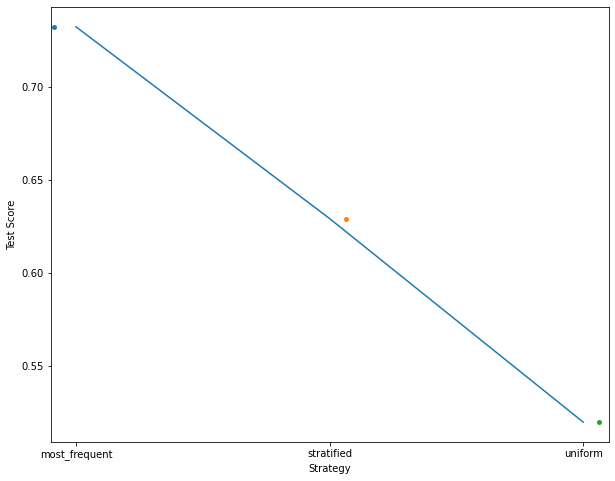

In [1110]:
plt.figure(figsize=(10,8))
ax = sns.stripplot(strategies,test_scores)
sns.lineplot(x=strategies,y=test_scores,ax=ax)
ax.set(xlabel ='Strategy', ylabel ='Test Score') 
plt.show() 

### confusion matrix 

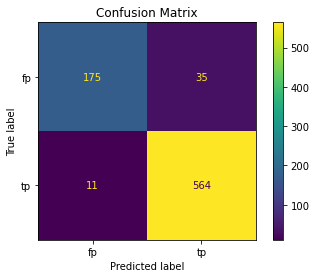

In [1111]:
plot_confusion_matrix(knn, X_test, Y_test, display_labels= ['fp', 'tp'], normalize= None)
plt.title('Confusion Matrix')
plt.show()

In [1112]:
class_report = classification_report(Y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         0.0       0.98      0.91      0.94       210
         1.0       0.97      0.99      0.98       575

    accuracy                           0.97       785
   macro avg       0.97      0.95      0.96       785
weighted avg       0.97      0.97      0.97       785



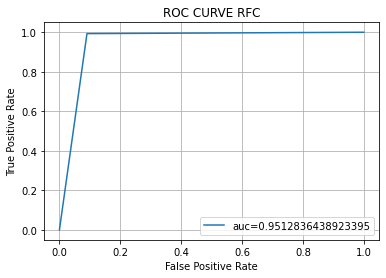

The Score for the ROC Curve is : 95.13000000000001%


In [1113]:
fpr, tpr, _= roc_curve(Y_test, y_pred)
auc_score = roc_auc_score(Y_test, y_pred)
plt.plot(fpr, tpr, label="auc="+str(auc_score))
plt.box(True)
plt.title('ROC CURVE RFC')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc=4)
plt.grid(True)
plt.show()
print('The Score for the ROC Curve is : {}%'.format(round(auc_score,4)*100))